# Исследование рынка общепита Москвы

**Цель исследования** — исследовать рынок общепита Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для нового заведения.

**Ход исследования**

Данные с заведениями общественного питания Москвы, полученные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года, мы получили из файла: `/datasets/moscow_places.csv`.

Исследование будет включать следующие этапы:
 1. [Обзор, подготовка и проверка данных.](#info)
 2. [Анализ данных](#anal): исследуем категории, рейтинги, соотношения заведений, средний чек, распределение по районам Москвы.
 3. [Детализация](#detail): узнаем, стоит ли открывать именно кофейню.
 4. [Выводы и презентация.](#conclusion)

<a id="info"></a>
## Обзор, подготовка и проверка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster

In [2]:
moscow_places = pd.read_csv('/datasets/moscow_places.csv')
  
display(moscow_places.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
print(moscow_places.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


В таблице 14 столбцов с различными типами данных — object и float64. Всего представлены записи о 8 406 заведениях Москвы.

Согласно документации к данным структура moscow_places.csv следующая:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

Количество значений в столбцах различается. Значит, в данных есть пропущенные значения.

In [4]:
print(moscow_places.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


В данных присутствуют значительные пропуски - в столбцах режима работы, категории цен и средней стоимости заказа, но заполнить их невозможно. Оставим пока все как есть.

Проверим наличие дубликатов.

In [5]:
print(moscow_places.duplicated().sum())

0


Явных дубликатов не обнаружено.

Заменим условные обозначения в столбце chain на более понятные - chain (для сетевых точек) и singlе (для единственных заведений).

In [6]:
moscow_places['chain'] = moscow_places['chain'].replace([0, 1], ['single', 'chain'])

Добавим столбец с указанием улицы, на которой находится заведение.

In [7]:
moscow_places['street'] = moscow_places['address'].str.split(',').str[1]

Добавим столбец с обозначением, что заведение работает ежедневно и круглосуточно.

In [8]:
moscow_places['is_24/7'] = moscow_places['hours'].str.contains('ежедневно, круглосуточно')

In [9]:
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,single,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,single,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,single,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,single,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,chain,148.0,Правобережная улица,False


В результате предобработки мы выяснили, что нам предстоит проанализировать 8406 записей о московских заведениях общепита. Каждая запись содержит информацию о названии заведения, категории, адресе и районе, часах работы, местоположении, рейтинге, категории цен, среднем чеке, принадлежности к сети и количестве мест.

Было обнаружено достаточно много пропусков в данных. В связи с невозможностью их заполнения принято решение оставить как есть. Дубликатов в данных нет. Для дальнейшего анализа добавлены стобцы с названием улицы и обозначением работы заведения 24/7.

<a id="anal"></a>
## Анализ данных

### Количество заведений по категориям

In [10]:
cat = moscow_places['category'].value_counts().reset_index()
display(cat)

,index,category
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [11]:
fig=px.bar(cat.sort_values(by='category', ascending=True), x='category', y='index', text='category')
fig.update_layout(title='Количество объектов общепита по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')
fig.show();

В тройку самых популярных заведений Москвы вошли кафе, рестораны и кофейни. Замыкают рейтинг столовые и булочные - их почти в 10 раз меньше, чем кафе.

### Количество посадочных мест по категориям

In [12]:
cat_seat = moscow_places['seats'].groupby(moscow_places['category']).median().round(1).sort_values(ascending=False).reset_index()
display(cat_seat)

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [13]:
fig=px.bar(cat_seat.sort_values(by='seats', ascending=True), x='seats', y='category', text='seats')
fig.update_layout(title='Медианное количество посадочных мест по категориям',
                   xaxis_title='Количество мест',
                   yaxis_title='Категории')
fig.show();

По количеству мест на первом месте по прежнему рестораны, а следом идут бары и пабы - дает о себе знать барная стойка. На последнем месте и в этом рейтинге булочные.

### Соотношение сетевых и несетевых заведений

In [14]:
chain_cnt = moscow_places['chain'].value_counts().reset_index()
chain_cnt['part'] = (chain_cnt['chain']/len(moscow_places['chain'])*100).round(1)
display(chain_cnt)

,index,chain,part
0,single,5201,61.9
1,chain,3205,38.1


In [15]:
fig = go.Figure(data=[go.Pie(labels=chain_cnt['index'], values=chain_cnt['chain'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений', 
                  width=600, 
                  height=400,
                  annotations=[dict(x=1.24, 
                                    y=1.1,
                                    text='Принадлежность к сети',
                                    showarrow=False)])
fig.show()

Несетевые заведения преобладают в Москве - 62% против 38% сетевых.

### Категории сетевых заведений

In [16]:
chain = moscow_places.query('chain=="chain"')
chain_cat = chain['category'].value_counts().reset_index()
display(chain_cat)

,index,category
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


In [17]:
fig=px.bar(chain_cat.sort_values(by='category', ascending=True), x='category', y='index', text='category')
fig.update_layout(title='Количество сетевых объектов общепита по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')
fig.show();

Среди сетевых заведений наиболее распространенные категории - кафе, рестораны, кофейни.

### Топ-15 популярных сетей в Москве

In [18]:
top_15_chain = chain.groupby(['name', 'category'])['address'].count().sort_values(ascending=False).reset_index().head(15)
display(top_15_chain)

,name,category,address
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


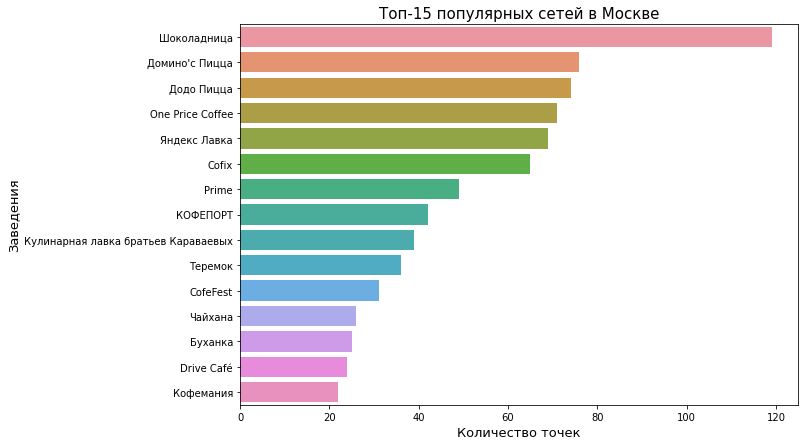

In [19]:
plt.figure(figsize=(10, 7))
ax = sns.barplot(x='address', y='name', data=top_15_chain)
plt.title('Топ-15 популярных сетей в Москве', fontsize=15)
plt.xlabel('Количество точек', fontsize=13)
plt.ylabel('Заведения', fontsize=13);

Возглавляет топ самых распространенных московских сетей кофейня "Шоколадница", следом за ней идут две пиццерии, а также кофейни и рестораны.

Посмотрим распределение сеток по районам.

In [20]:
chain_dist = chain.pivot_table(index='district', columns='category', values='address', aggfunc='count')

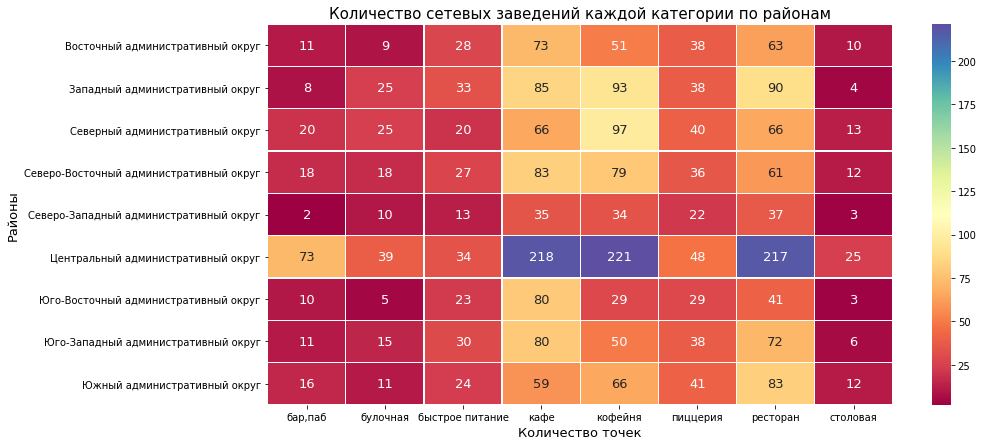

In [21]:
plt.figure(figsize=(14, 7))
sns.heatmap(chain_dist, linewidths= .3, cmap='Spectral', annot=True , fmt='d', annot_kws={'size':13})
plt.title('Количество сетевых заведений каждой категории по районам', fontsize=15)
plt.xlabel('Количество точек', fontsize=13)
plt.ylabel('Районы', fontsize=13);

Самое большое скопление заведений общепита, конечно же, в центре. Здесь количество кофеен, кафе и ресторанов превышает отметку в 200 точек по каждой категории. Здесь же больше всего баров и пабов, которых в остальных районах не так и много. По графику видно, что четвертое место по количеству точек по всем районам занимают пиццерии.

### Распределение категорий заведений по административным районам Москвы

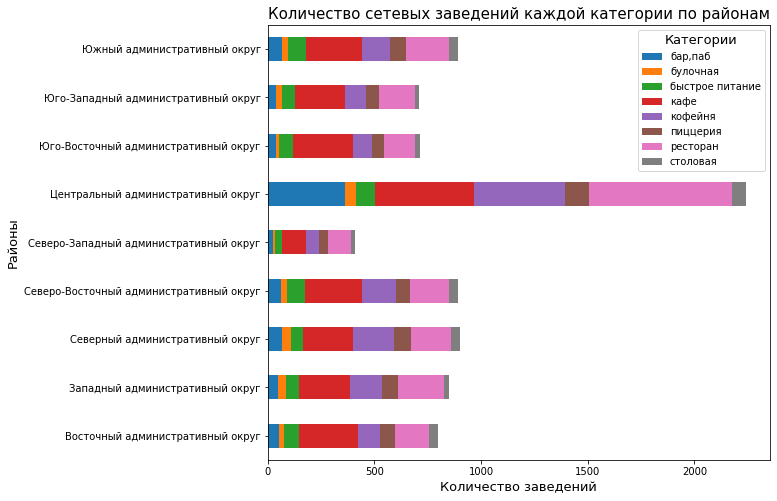

In [22]:
total_dist = moscow_places.pivot_table(index='district', columns='category', values='address', aggfunc='count')
total_dist.plot(kind='barh', stacked=True, figsize=(9, 8))
plt.xlabel('Количество заведений', fontsize=13)
plt.ylabel('Районы', fontsize=13)
plt.legend(title = 'Категории', title_fontsize = 13)
plt.title('Количество сетевых заведений каждой категории по районам', fontsize=15);

По общему количеству заведений общепита сильно вырывается вперед Центральный АО, особенно это касается таких категорий как бары, кофейни и рестораны. Самым "негостеприимным" оказался Северо-Западный АО, хотя здесь присутствуют места из всех категорий.

### Распределение средних рейтингов по категориям заведений

In [23]:
cat_rate = moscow_places['rating'].groupby(moscow_places['category']).mean().round(1).sort_values(ascending=False).reset_index()
fig=px.bar(cat_rate.sort_values(by='rating', ascending=True), x='rating', y='category', text='rating')
fig.update_layout(title='Усредненный рейтинг по категориям',
                   xaxis_title='Рейтинг',
                   yaxis_title='Категории')
fig.show();

В среднем каждая категория общепита имеет рейтинг от 4 до 5 баллов. Лидируют бары и пабы с отметкой 4.4. Наименьшее значение получили фастфуды и кафе - 4.1. В остальных категориях рейтинг распределен примерно одинаково: 4.2 - 4.3.

### Средний рейтинг заведений по районам

In [24]:
rate_dist = moscow_places.groupby('district')['rating'].mean().round(1).sort_values(ascending=False).reset_index()

In [25]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except FileNotFoundError:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rate_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

Самые высокооцениваемые заведения, ожидаемо, находятся в центре. Самый же низкий рейтинг у Северо- и Юго-Восточного АО.

### Карта заведений

In [26]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

moscow_places.apply(create_clusters, axis=1)
m

### Топ-15 улиц по количеству заведений

In [27]:
top_15_street = moscow_places.groupby(['street'])['address'].count().sort_values(ascending=False).reset_index().head(15)
display(top_15_street)

,street,address
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


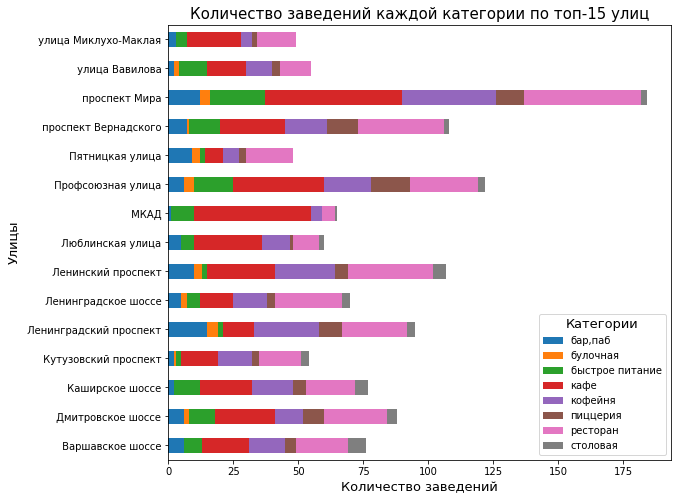

In [28]:
top_15_street_total = moscow_places.query('street in @top_15_street["street"]')
top_15_street_cat = top_15_street_total.pivot_table(index='street', columns='category', values='address', aggfunc='count')

top_15_street_cat.plot(kind='barh', stacked=True, figsize=(9, 8))
plt.xlabel('Количество заведений', fontsize=13)
plt.ylabel('Улицы', fontsize=13)
plt.legend(title = 'Категории', title_fontsize = 13)
plt.title('Количество заведений каждой категории по топ-15 улиц', fontsize=15);

Самой "злачной" улицей Москвы оказался проспект Мира - здесь более 180 заведений общепита!

### Один за всех

Найдем улицы, на которых находится только один объект общепита.

In [29]:
one_n_only = moscow_places.groupby(['street'])['address'].count().sort_values(ascending=True).reset_index()
one_n_only = one_n_only.query('address==1')
one_n_only_total = moscow_places.query('street in @one_n_only["street"]')
one_n_only_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 458 entries, 15 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               458 non-null    object 
 1   category           458 non-null    object 
 2   address            458 non-null    object 
 3   district           458 non-null    object 
 4   hours              431 non-null    object 
 5   lat                458 non-null    float64
 6   lng                458 non-null    float64
 7   rating             458 non-null    float64
 8   price              182 non-null    object 
 9   avg_bill           194 non-null    object 
 10  middle_avg_bill    165 non-null    float64
 11  middle_coffee_cup  24 non-null     float64
 12  chain              458 non-null    object 
 13  seats              156 non-null    float64
 14  street             458 non-null    object 
 15  is_24/7            431 non-null    object 
dtypes: float64(6), object(10

458 улиц, где всего одно заведение! Посмотрим, какие категории представлены и размеры заведений.

In [30]:
one_n_only_cat = one_n_only_total['category'].value_counts().reset_index()
fig=px.bar(one_n_only_cat.sort_values(by='category', ascending=True), x='category', y='index', text='category')
fig.update_layout(title='Количество объектов общепита по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')
fig.show();

In [31]:
one_n_only_cat_seat = one_n_only_total['seats'].groupby(one_n_only_total['category']).median().round(1).sort_values(ascending=False).reset_index()
fig=px.bar(one_n_only_cat_seat.sort_values(by='seats', ascending=True), x='seats', y='category', text='seats')
fig.update_layout(title='Медианное количество посадочных мест по категориям',
                   xaxis_title='Количество мест',
                   yaxis_title='Категории')
fig.show();

В основном представлены небольшие кофейни, рестораны и кафе на 40-50 посадочных мест. Самыми вместительными оказались немногочисленные столовые: медианное значение - 80 посадочных мест.

### Средний чек

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [32]:
median_bill_dist = moscow_places.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
median_bill_dist

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [33]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except FileNotFoundError:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_bill_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)
m

Самые высокие цены в заведениях Центрального и Западного АО. А дешевле всего можно перекусить в Юго-восточном округе. Возможно, на средний чек влияет не столько расстояние до центра города, сколько престижность самого района.

### Выводы

В ходе исследования были проанализированы данные о 8 406 московских заведениях общепита. Выяснилось, что **самыми популярными категориями** являются кафе, рестораны и кофейни. Меньше всего в городе столовых и булочных.

**Рейтинг вместительности** несколько иной. Впереди по-прежнему рестораны, но следом идут бары и пабы. Столовые здесь на 4м месте - их хоть и немного, но посадочных мест они обеспечивают достаточно. А вот кофейни, которых в городе больше всего, оказались совсем небольшими.

Из всех заведений Москвы - только **38% относятся к сетевым**. Все остальные - индивидуальные проекты. Разбивка по категориям среди сетевиков повторяет общую картину общепита - начинается с кафе, ресторанов и кофеен и заканчивается булочными и столовыми.

Среди **15 самых распространенных сетей** - кофейни, пиццерии, рестораны, кафе и даже булочная. Возглавляет рейтинг кофейня "Шоколадница" - почти 120 точек по всей Москве. Больше всего сетевых заведений можно встретить в центре - более 600 кофеен, кафе и ресторанов. Здесь же больше всего баров и пабов, которых в остальных районах не так и много. Более-менее равномерно распределились по всем районам пиццерии и оказались на четвертом месте по количеству точек.

Центральный АО лидирует не только по количеству сетевых заведений, но и по общей картине тоже. Наименее заполненным оказался Северо-Западный АО.

**Средний рейтинг** по категориям варьируется от 4.1 у быстрого питания и кафе до 4.4 у баров и пабов. Если посмотреть на разбивку по районам, то самые высокие оценки у заведений центрального района, а самые худшие места оказались в Северо-Восточном и Юго-Восточном АО.

**Самый большой выбор** мест общепита на проспекте Мира - 184 заведения. Также больше 100 точек на Профсоюзной ул., пр. Вернадского и Ленинском пр.

Немало в Москве и таких улиц, где находится **всего одно заведение** - целых 458. В большинстве случаев это кафе, рестораны и кофейни с вместимостью до 50 гостей.

По **среднему чеку** к лидеру по всем параметрам Центральному АО присоединяется Западный АО. Медианное значение среднего чека по всем заведениям в этих округах составляет 1000 руб. Наименьшее значение, 450 руб., оказалось в Юго-Восточном округе. Скорее всего, этот показатель зависит от привлекательности, благоустроенности района.

<a id="detail"></a>
## Детализация: открытие кофейни

Посмотрим, стоит ли открывать кофейню в таком большом городе как Москва, и как это сделать лучше всего.

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [34]:
coffee_house = moscow_places.query('category=="кофейня"')
coffee_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   object 
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1398 non-null   object 
dtypes: float64(6), object(10

1413 наименований кофеен на весь город. Это немало. Посмотрим, как они расположены по районам.

In [35]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_house.apply(create_clusters, axis=1)
m

In [36]:
coffee_house_dist = coffee_house.groupby('district')['category'].count().sort_values(ascending=False).reset_index()
coffee_house_dist

,district,category
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [37]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except FileNotFoundError:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_house_dist,
    columns=['district', 'category'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)
m

Почти треть всех кофеен Москвы сосредоточена в Центральном АО. Открыть здесь конкурентноспособную кофейню будет крайне сложно. Стоит рассмотреть другие районы.

Рассмотрим режим работы.

In [38]:
coffee_house['is_24/7'].value_counts()

False    1339
True       59
Name: is_24/7, dtype: int64

Всего 59 кофеен работают ежедневно и круглосуточно. Придется попотеть, чтобы отыскать вкусный и свежий кофе посреди ночи или в выходной.

Интересно, как высоко посетители кофеен оценивают места своего досуга?

In [39]:
coffee_house_rate = coffee_house.groupby('district')['rating'].mean().round(2).sort_values(ascending=False).reset_index()
coffee_house_rate

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [40]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except FileNotFoundError:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_house_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Распределение рейтинга кофеен по районам',
).add_to(m)
m

Ссылаясь на данное исследование, можно заявить, что в Западом АО подают худший кофе в столице. А согласно проведенному выше анализу средний чек здесь не отстает от заведений центрального района. Хотя, возможно, у местных жителей слегка завышены ожидания.

Посмотрим внимательнее, как разнится стоимость капучино от района к району.

In [41]:
coffee_house_cup = coffee_house.groupby('district')['middle_coffee_cup'].median().round(1).sort_values(ascending=False).reset_index()
coffee_house_cup

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [42]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except FileNotFoundError:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_house_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m)
m

Неожиданно на юго-западе оказался самый дорогой кофе в Москве.

<a id="conclusion"></a>
## Выводы и презентация

В Москве уже достаточно много кофеен и оказаться очередной забегаловкой по дороге на работу или окошком с кофе на вынос довольно легко. Но чтобы открыть действительно крутое место, куда люди будут идти за атмосферой и настроением, сопровождающимися приятными напитками, нужно постараться.

С точки зрения **расположения** не стоит присоединяться к масштабным скоплениям заведений. Да, там, возможно, бОльшая проходимость, но и очень сильный уровень конкуренции. Недостаток кофеен ощущается в следующих районах: Восточный, Юго-Западный, Юго-Восточный и Северо-Западный АО. По **качеству** страдают Юго-Восточный, Южный, Северо-Восточный и Западный.

Желательно более точно **определить ЦА** - примерный возраст, уровень дохода, статус занятости и семейное положение. Если же ориентироваться на "Друзей", то это молодые специалисты 30-35 лет.

По **стоимости** стоит обратить внимание на северные округа - здесь чашка капучино не так дорога, как в Западном и Центральном районах (от 190 руб. и выше), и не такая дешевая как на юге и востоке (меньше 150 руб.). Медианное значение колеблется в пределах 159-165 рублей. Слишком высокую цену не все посетители будут готовы платить, а слишком низкая заставит сомневаться в качестве напитка.

Выбирая из северных районов снова обратимся к **количеству и рейтингам**. В Северном АО достаточно много кофеен, этот район занимает второе место после центра. Оценка качества у этих точек тоже достаточно высока - 4.29.

**Сравним Северо-Восток и Северо-Запад**.  У первого много заведений, но низкий рейтинг, а у второго все наоборот - кофеен немного, но рейтинг достаточно высок (лучший после центра). 

**В первом случае** рискуем "смешаться с толпой" и показаться очередной невкусной и неудобной точкой. Необходимо будет приложить много усилий, чтобы убедить потенциальных посетителей в том, что именно эта кофейня превзойдет их ожидания и станет любимым местом встреч с друзьями. 

Если **выбрать Северо-Запад**, то здесь надо не полениться, продумать все детали и открыть действительно крутое место, чтобы не отставать от соседей с высоким рейтингом. Также необходимо будет провести **дополнительное исследование** района и внимательно выбрать место для  кофейни, чтобы не оказаться рядом с лесом или промзоной с малой проходимостью. 

**Дополнительный совет** - если найти место рядом с развлекательными точками или вблизи баров, то можно подумать о режиме работы 24/7.

**Презентация**: https://disk.yandex.ru/i/l3Q2THq-p7iweA 